# fromtraindataset _ Collecting images by class

In [30]:
import os
import shutil
from pycocotools.coco import COCO

# Path to COCO dataset folder in the Downloads directory
downloads_folder = os.path.expanduser('~/Downloads')
data_dir = os.path.join(downloads_folder, 'COCOdataset')
annotation_file = os.path.join(data_dir, 'annotations_trainval2014/annotations', 'captions_train2014.json')
# image_dir = os.path.join(data_dir, 'train2014/train2014')
image_dir = os.path.join(data_dir, 'train2014', 'train2014')

# Initialize COCO API for captions
coco = COCO(annotation_file)

# Get image ids
image_ids = coco.getImgIds()

# Choose the next 100 images (starting from index 100)
start_index = 1
end_index = start_index + 100000
selected_image_ids = image_ids[start_index:end_index]

# Create a new folder for selected images
selected_folder = 'selected_images_coco_train'
os.makedirs(selected_folder, exist_ok=True)

# Create a subfolder for images with "elephant" in their captions
class_folder = os.path.join(selected_folder, 'dog')
# other_folder = os.path.join(selected_folder, 'others')
os.makedirs(class_folder, exist_ok=True)



# Copy selected images and their captions
for img_id in selected_image_ids:
    # Get image information
    img_info = coco.loadImgs(img_id)[0]
    img_filename = img_info['file_name']
    img_path = os.path.join(image_dir, img_filename)
    
    # Get captions for the image
    ann_ids = coco.getAnnIds(imgIds=img_id)
    captions = [coco.loadAnns(ann_id)[0]['caption'] for ann_id in ann_ids]
    
    # Check if any caption contains the word "class name"
    if any('dogs ' in caption.lower() for caption in captions):
        # Copy image to class folder
        shutil.copy(img_path, class_folder)
#         print(img_path)
        
        # Save captions to a text file inside elephant folder
        with open(os.path.join(class_folder, f'{img_id}_captions.txt'), 'w') as f:
            f.write('\n'.join(captions))
#     else:
#         # Copy image to selected folder
#         shutil.copy(img_path, other_folder)
        
#         # Save captions to a text file inside selected folder
#         with open(os.path.join(other_folder, f'{img_id}_captions.txt'), 'w') as f:
#             f.write('\n'.join(captions))


loading annotations into memory...
Done (t=0.64s)
creating index...
index created!


# Random 5 images in each class

Displaying random images from class 'baseball':


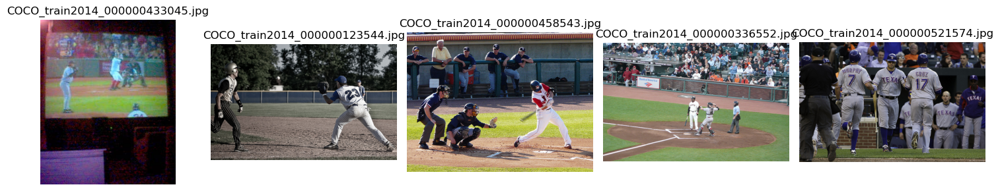


Displaying random images from class 'bicycle':


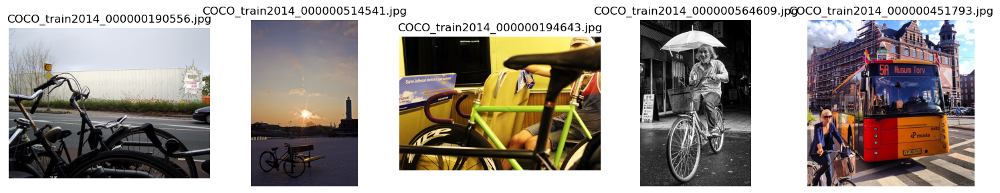


Displaying random images from class 'birds':


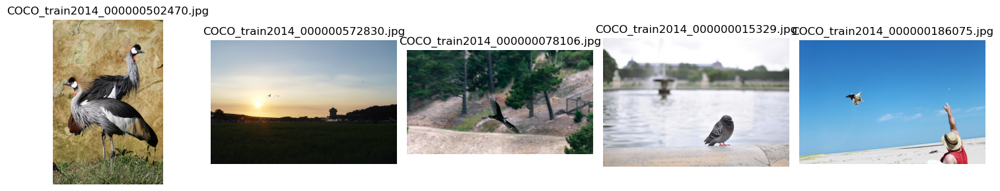


Displaying random images from class 'boat':


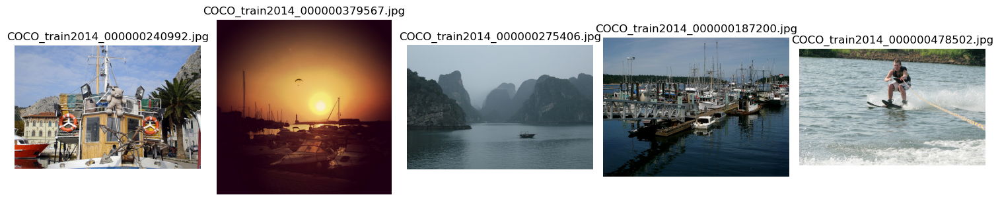


Displaying random images from class 'bus':


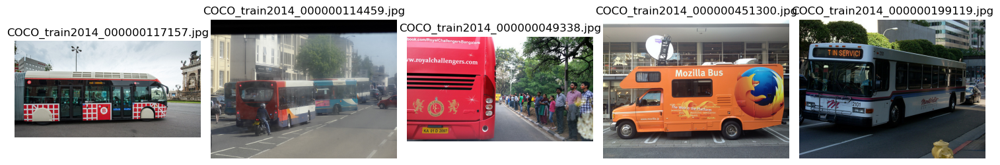


Displaying random images from class 'car':


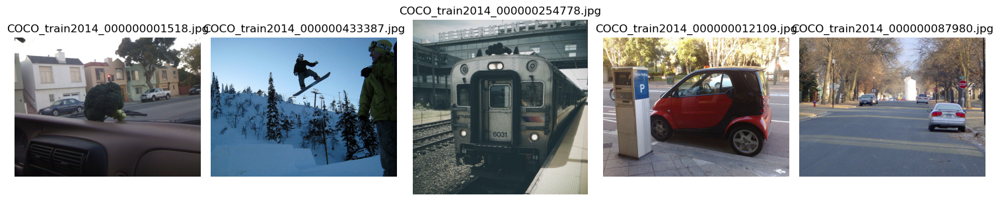


Displaying random images from class 'cat':


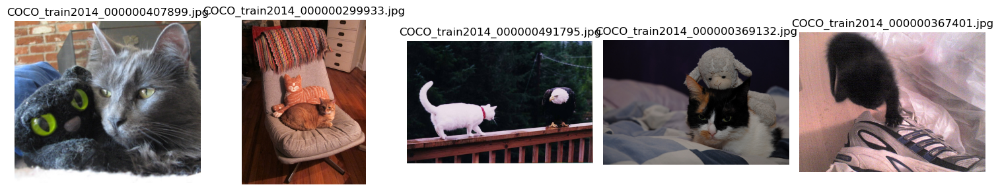


Displaying random images from class 'dog':


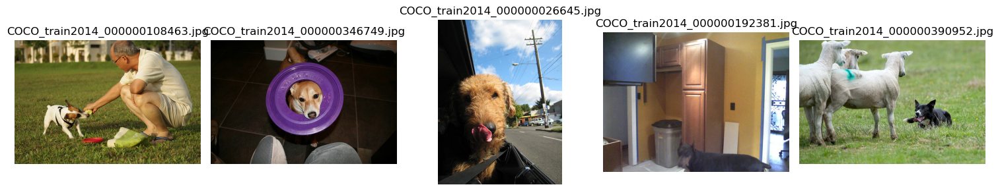


Displaying random images from class 'elephant':


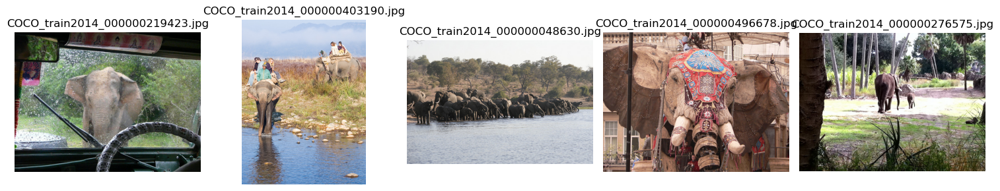


Displaying random images from class 'horse':


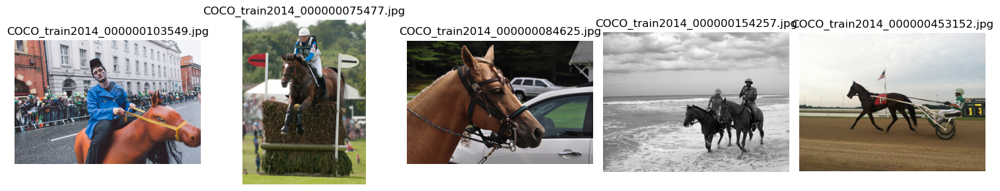


Displaying random images from class 'motorbikes':


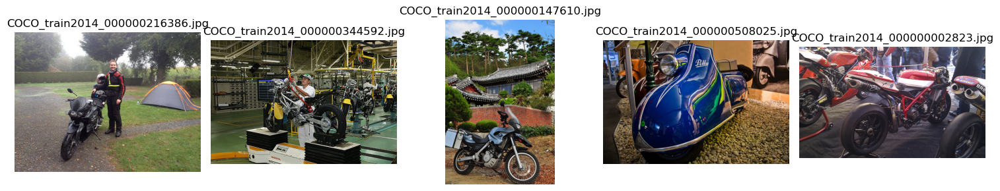


Displaying random images from class 'plane':


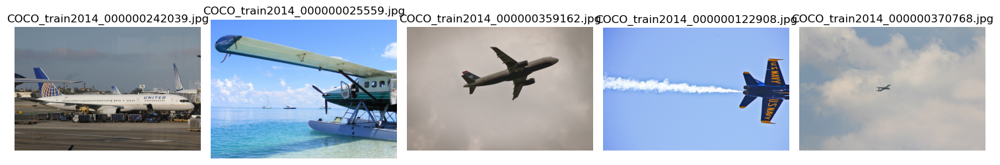


Displaying random images from class 'surfboard':


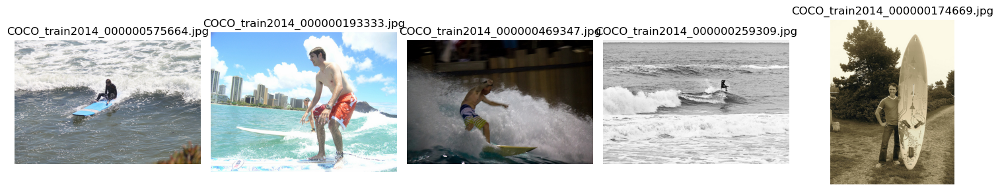


Displaying random images from class 'train':


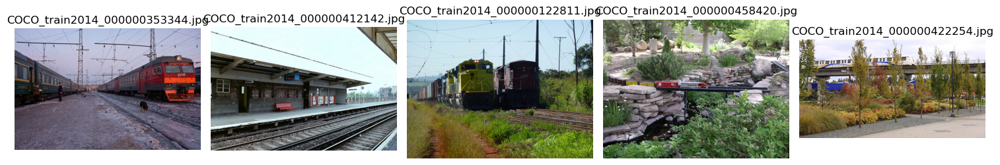


Displaying random images from class 'truck':


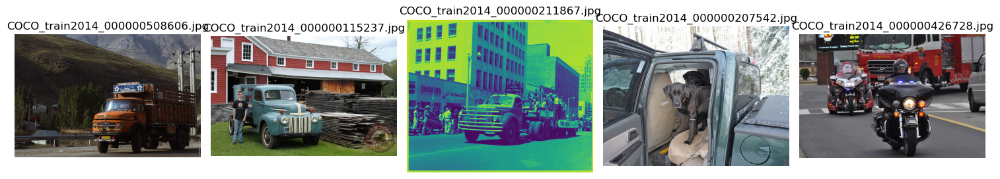


Displaying random images from class 'zebra':


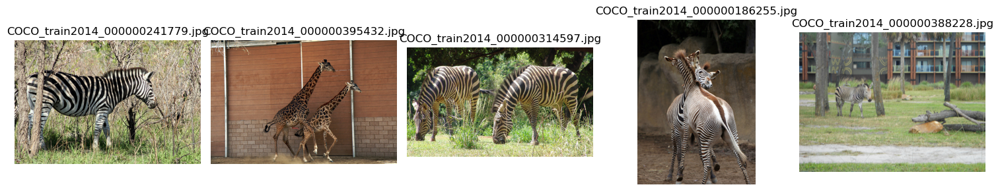

In [34]:
import os
import random
import matplotlib.pyplot as plt
from matplotlib.image import imread

# Path to the directory containing image folders
data_dir = 'selected_images_coco_train'

# Function to display random images from a folder in one row
def display_random_images_in_row(folder_path, num_images=5):
    fig, axs = plt.subplots(1, num_images, figsize=(15, 3))  # Create a row of subplots
    axs = axs.ravel()  # Flatten the subplot array

    image_files = [file_name for file_name in os.listdir(folder_path) if file_name.endswith('.jpg')]
    random.shuffle(image_files)  # Shuffle the list of image files

    image_count = 0
    for file_name in image_files[:num_images]:
        img_path = os.path.join(folder_path, file_name)
        image = imread(img_path)
        axs[image_count].imshow(image)
        axs[image_count].axis('off')
        axs[image_count].set_title(file_name)
        image_count += 1

    plt.tight_layout()
    plt.show()

# Loop through each folder (class) in the data directory
for folder_name in os.listdir(data_dir):
    folder_path = os.path.join(data_dir, folder_name)
    if os.path.isdir(folder_path):
        print(f"Displaying random images from class '{folder_name}':")
        display_random_images_in_row(folder_path)
        print()  # Add a newline for better readability between classes
